In [70]:
import ast
import json
from collections import Counter

import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import string
import nltk
import tqdm

from autocorrect import Speller
spell = Speller()

from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
stopwords_eng = stopwords.words("english")

from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer


from sklearn.cluster import AgglomerativeClustering

from gensim.corpora import Dictionary
from gensim.models.ldamodel import LdaModel
from gensim import corpora
from gensim.models import CoherenceModel
import gensim

from gensim.models import Word2Vec
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

## Reading Data

#### Since we scraped data into multiple files of 2000 rows per file we now concat all CSVs into one dataframe

In [71]:
df2k = pd.read_csv('imdb_movies_detail_2000.csv')

In [72]:
df4k = pd.read_csv('imdb_movies_detail_4000.csv')

In [73]:
df6k = pd.read_csv('imdb_movies_detail_6000.csv')

In [74]:
df8k = pd.read_csv('imdb_movies_detail_8000.csv')

In [75]:
df10k = pd.read_csv('imdb_movies_detail_10000.csv')

In [76]:
movies_df = pd.concat([df2k, df4k, df6k, df8k, df10k])

In [77]:
movies_df.shape

(5439, 12)

In [78]:
movies_df.head()

,imdb_id,rating_count,best_rating,worst_rating,rating,genre,keywords,trailer_link,actors,director,synopsis,summary
0,tt1160419,841928.0,10.0,1.0,8.0,"['Action', 'Adventure', 'Drama']","['mother son relationship', 'mind control', 'e...",https://www.imdb.com/video/vi3986080537/,"['Timothée Chalamet', 'Rebecca Ferguson', 'Zen...",['Denis Villeneuve'],The story opens with a woman telling a portion...,A noble family becomes embroiled in a war for ...
1,tt4513678,216621.0,10.0,1.0,7.0,"['Adventure', 'Comedy', 'Fantasy']","['ghost', 'ghostbuster', 'ghostbusters', 'sing...",https://www.imdb.com/video/vi637322009/,"['Carrie Coon', 'Paul Rudd', 'Finn Wolfhard']",['Jason Reitman'],"In the pre-title sequence, a proton blast shoo...",When a single mom and her two kids arrive in a...
2,tt5034838,239498.0,10.0,1.0,6.3,"['Action', 'Sci-Fi', 'Thriller']","['monster versus monster', 'kaiju', 'godzilla ...",https://www.imdb.com/video/vi576962841/,"['Alexander Skarsgård', 'Millie Bobby Brown', ...",['Adam Wingard'],Five years after Godzilla defeated King Ghidor...,The epic next chapter in the cinematic Monster...
3,tt11235772,31826.0,10.0,1.0,6.1,"['Drama', 'Mystery', 'Romance']","['female voyeur', 'couple having sex while wat...",https://www.imdb.com/video/vi1130217497/,"['Sydney Sweeney', 'Justice Smith', 'Ben Hardy']",['Michael Mohan'],"A young couple, Pippa and Thomas, move into th...",Pippa and Thomas move into their dream apartme...
4,tt10872600,875483.0,10.0,1.0,8.2,"['Action', 'Adventure', 'Fantasy']","['spider man character', 'superhero', 'marvel ...",https://www.imdb.com/video/vi3348546073/,"['Tom Holland', 'Zendaya', 'Benedict Cumberbat...",['Jon Watts'],After Quentin Beck (Jake Gyllenhaal) frames Pe...,"With Spider-Man's identity now revealed, Peter..."


In [79]:
title_df = pd.read_csv('imdb_movies_ids.csv', usecols=['id', 'title', 'year'])

In [80]:
title_df.head()

,id,title,year
0,tt1160419,1. Dune: Part One,2021
1,tt4513678,2. Ghostbusters: Afterlife,2021
2,tt5034838,3. Godzilla vs. Kong,2021
3,tt11235772,4. The Voyeurs,2021
4,tt10872600,5. Spider-Man: No Way Home,2021


#### We had titles and year in a different file and hence merged them into a single DF

In [81]:
df = pd.merge(left=movies_df, right=title_df, how='inner', left_on='imdb_id', right_on='id')

In [82]:
df.head()

,imdb_id,rating_count,best_rating,worst_rating,rating,genre,keywords,trailer_link,actors,director,synopsis,summary,id,title,year
0,tt1160419,841928.0,10.0,1.0,8.0,"['Action', 'Adventure', 'Drama']","['mother son relationship', 'mind control', 'e...",https://www.imdb.com/video/vi3986080537/,"['Timothée Chalamet', 'Rebecca Ferguson', 'Zen...",['Denis Villeneuve'],The story opens with a woman telling a portion...,A noble family becomes embroiled in a war for ...,tt1160419,1. Dune: Part One,2021
1,tt4513678,216621.0,10.0,1.0,7.0,"['Adventure', 'Comedy', 'Fantasy']","['ghost', 'ghostbuster', 'ghostbusters', 'sing...",https://www.imdb.com/video/vi637322009/,"['Carrie Coon', 'Paul Rudd', 'Finn Wolfhard']",['Jason Reitman'],"In the pre-title sequence, a proton blast shoo...",When a single mom and her two kids arrive in a...,tt4513678,2. Ghostbusters: Afterlife,2021
2,tt5034838,239498.0,10.0,1.0,6.3,"['Action', 'Sci-Fi', 'Thriller']","['monster versus monster', 'kaiju', 'godzilla ...",https://www.imdb.com/video/vi576962841/,"['Alexander Skarsgård', 'Millie Bobby Brown', ...",['Adam Wingard'],Five years after Godzilla defeated King Ghidor...,The epic next chapter in the cinematic Monster...,tt5034838,3. Godzilla vs. Kong,2021
3,tt11235772,31826.0,10.0,1.0,6.1,"['Drama', 'Mystery', 'Romance']","['female voyeur', 'couple having sex while wat...",https://www.imdb.com/video/vi1130217497/,"['Sydney Sweeney', 'Justice Smith', 'Ben Hardy']",['Michael Mohan'],"A young couple, Pippa and Thomas, move into th...",Pippa and Thomas move into their dream apartme...,tt11235772,4. The Voyeurs,2021
4,tt10872600,875483.0,10.0,1.0,8.2,"['Action', 'Adventure', 'Fantasy']","['spider man character', 'superhero', 'marvel ...",https://www.imdb.com/video/vi3348546073/,"['Tom Holland', 'Zendaya', 'Benedict Cumberbat...",['Jon Watts'],After Quentin Beck (Jake Gyllenhaal) frames Pe...,"With Spider-Man's identity now revealed, Peter...",tt10872600,5. Spider-Man: No Way Home,2021


## Preliminary EDA & Data Wrangling

In [83]:
df.columns

Index(['imdb_id', 'rating_count', 'best_rating', 'worst_rating', 'rating',
       'genre', 'keywords', 'trailer_link', 'actors', 'director', 'synopsis',
       'summary', 'id', 'title', 'year'],
      dtype='object')

#### Dropping redundant ID column

In [84]:
df.drop('id', axis=1, inplace=True)

In [85]:
df.columns

Index(['imdb_id', 'rating_count', 'best_rating', 'worst_rating', 'rating',
       'genre', 'keywords', 'trailer_link', 'actors', 'director', 'synopsis',
       'summary', 'title', 'year'],
      dtype='object')

In [86]:
df.isnull().mean()

imdb_id         0.000000
rating_count    0.000184
best_rating     0.000184
worst_rating    0.000184
rating          0.000184
genre           0.008090
keywords        0.000000
trailer_link    0.380217
actors          0.000000
director        0.000000
synopsis        0.892260
summary         0.002574
title           0.000000
year            0.000000
dtype: float64

In [87]:
df.dtypes

imdb_id          object
rating_count    float64
best_rating     float64
worst_rating    float64
rating          float64
genre            object
keywords         object
trailer_link     object
actors           object
director         object
synopsis         object
summary          object
title            object
year             object
dtype: object

In [88]:
df.describe()

,rating_count,best_rating,worst_rating,rating
count,5438.000000,5438.0,5438.0,5438.000000
mean,6951.585877,10.0,1.0,6.022214
std,39829.901327,0.0,0.0,1.719803
min,5.000000,10.0,1.0,1.000000
25%,26.000000,10.0,1.0,4.800000
50%,102.000000,10.0,1.0,6.100000
75%,582.750000,10.0,1.0,7.300000
max,875483.000000,10.0,1.0,10.000000


In [89]:
df.genre.nunique()

410

In [90]:
df.year.unique()

array(['2021', '53m', '2022', '2023', '1h 40m', '1h 15m', '1h 17m'],
      dtype=object)

In [91]:
mask = df['year'].str.contains('m')

In [92]:
df.loc[mask, 'year'] = '2021'

In [93]:
df.year.unique()

array(['2021', '2022', '2023'], dtype=object)

In [94]:
df['year'] = pd.to_datetime(df['year'], format='%Y').dt.year

In [95]:
df.dtypes

imdb_id          object
rating_count    float64
best_rating     float64
worst_rating    float64
rating          float64
genre            object
keywords         object
trailer_link     object
actors           object
director         object
synopsis         object
summary          object
title            object
year              int32
dtype: object

In [96]:
df.describe()

,rating_count,best_rating,worst_rating,rating,year
count,5438.000000,5438.0,5438.0,5438.000000,5439.000000
mean,6951.585877,10.0,1.0,6.022214,2021.482993
std,39829.901327,0.0,0.0,1.719803,0.500492
min,5.000000,10.0,1.0,1.000000,2021.000000
25%,26.000000,10.0,1.0,4.800000,2021.000000
50%,102.000000,10.0,1.0,6.100000,2021.000000
75%,582.750000,10.0,1.0,7.300000,2022.000000
max,875483.000000,10.0,1.0,10.000000,2023.000000


In [97]:
df['genre']

0         ['Action', 'Adventure', 'Drama']
1       ['Adventure', 'Comedy', 'Fantasy']
2         ['Action', 'Sci-Fi', 'Thriller']
3          ['Drama', 'Mystery', 'Romance']
4       ['Action', 'Adventure', 'Fantasy']
                       ...                
5434               ['Animation', 'Horror']
5435                             ['Drama']
5436                            ['Horror']
5437                                   NaN
5438      ['Comedy', 'Romance', 'Western']
Name: genre, Length: 5439, dtype: object

In [98]:
df[df['genre'].isnull()].shape

(44, 14)

In [99]:
df[df['summary'].isnull()].shape

(14, 14)

In [100]:
df['genre'].fillna(value='nogenre', inplace=True)

In [101]:
df['summary'] = df['summary'].fillna(value=' ')

In [102]:
df[df['genre'].isnull()].shape

(0, 14)

In [103]:
df[df['summary'].isnull()].shape

(0, 14)

#### As seen above we have genre spanning from single genre movie to multi-genre movies too, we want to have one main genre for each movie since the first genre given to a movie defines the main theme of the movie. Replacing multi-genre into one with the most dominant genre in the list.

In [104]:
def create_one_genre(data):
    if data != 'nogenre':
       return ast.literal_eval(data)[0]

In [105]:
df['genre'] = df['genre'].apply(create_one_genre)

In [106]:
df['genre'].value_counts()

genre
Documentary    1352
Drama          1074
Comedy          845
Horror          611
Action          487
Thriller        214
Crime           201
Animation       142
Adventure        99
Biography        86
Romance          52
Sci-Fi           52
Family           39
Fantasy          37
Mystery          36
Western          22
Music            20
Musical          10
History           6
War               4
Sport             4
Reality-TV        2
Name: count, dtype: int64

In [107]:
df['year'].unique()

array([2021, 2022, 2023])

#### Few genre such as Music and Musical can be one, similarly since War can also come under History combining them too

In [108]:
music_index = df.loc[df['genre'] == 'Music'].index
df.loc[music_index, 'genre'] = 'Musical'

In [109]:
war_index = df.loc[df['genre'] == 'War'].index
df.loc[war_index, 'genre'] = 'History'

In [110]:
df['genre'].value_counts()

genre
Documentary    1352
Drama          1074
Comedy          845
Horror          611
Action          487
Thriller        214
Crime           201
Animation       142
Adventure        99
Biography        86
Sci-Fi           52
Romance          52
Family           39
Fantasy          37
Mystery          36
Musical          30
Western          22
History          10
Sport             4
Reality-TV        2
Name: count, dtype: int64

## EDA

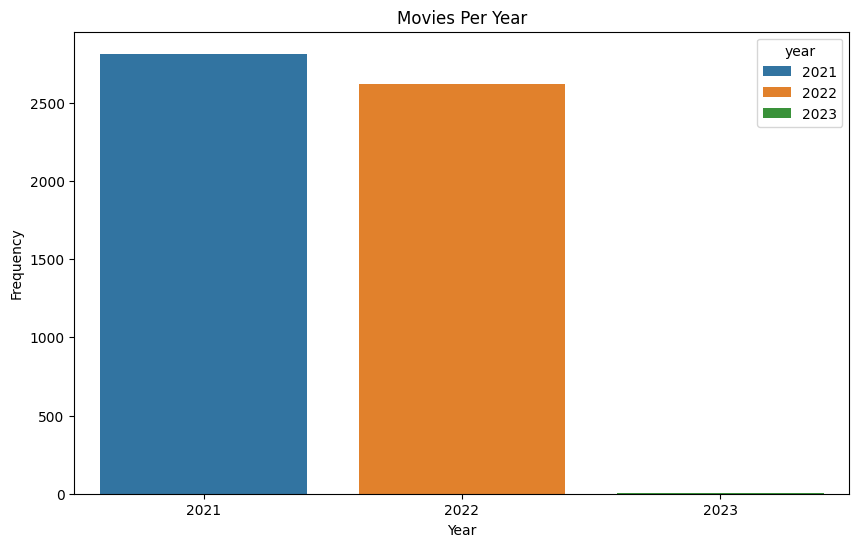

In [111]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='year', hue='year', palette=sns.color_palette(n_colors=3))
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.title('Movies Per Year')
plt.show()

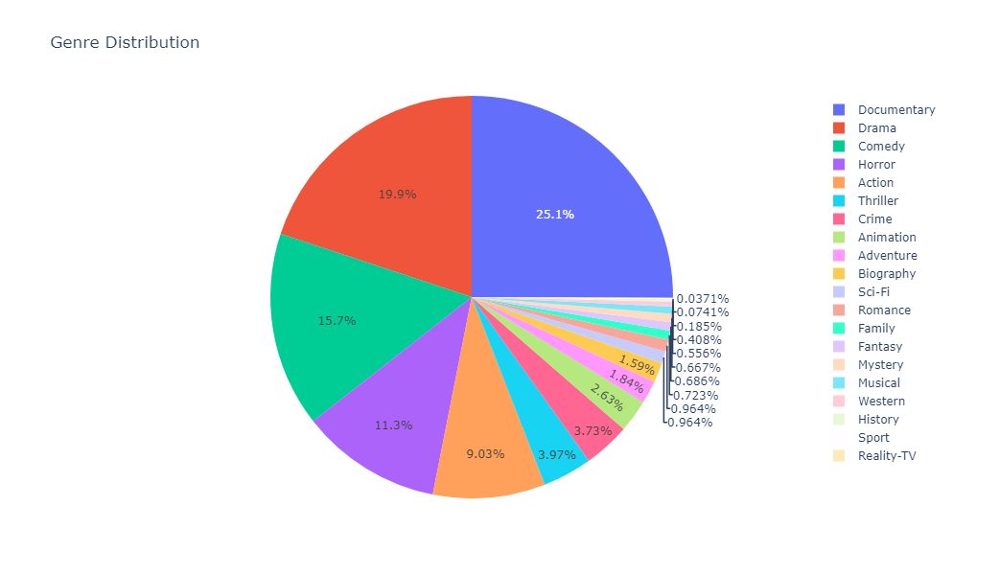

In [112]:
genre_counts = df['genre'].value_counts()

fig = px.pie(values=genre_counts, names=genre_counts.index, title='Genre Distribution', width=800, height=600)
fig.show()

## Text Cleaning

In [113]:
def regex_spell_len_fix(text):
    return re.sub(r'(.)\1{2,}', r'\1\1', text)

In [114]:
def remove_whitespace(text): 
    return text.strip()

In [115]:
def convert_to_lowercase(text): 
    return text.lower()

In [116]:
def remove_punctuation(text): 
    return text.translate(str.maketrans('', '', string.punctuation))

In [117]:
def tokenize(text): 
    return word_tokenize(text)

In [118]:
def fix_spell(token):
    return spell(token)

In [119]:
def remove_stop_words(tokens): 
    return [word for word in tokens if word not in stopwords_eng]

In [120]:
lem = WordNetLemmatizer()
def lemmatization(tokens):
    return [lem.lemmatize(word) for word in tokens]

In [121]:
def preprocess_pipeline(text): 
    text = regex_spell_len_fix(text)
    text = fix_spell(text)
    text = remove_whitespace(text)
    text = convert_to_lowercase(text)
    text = remove_punctuation(text)
    tokens = tokenize(text)
    tokens = remove_stop_words(tokens)
    return lemmatization(tokens)

In [122]:
df['preprocessed_tokens'] = df['summary'].apply(preprocess_pipeline)

In [123]:
df['preprocessed_tokens']

0       [noble, family, becomes, embroiled, war, contr...
1       [single, mom, two, kid, arrive, small, town, b...
2       [epic, next, chapter, cinematic, monsterverse,...
3       [pipe, thomas, move, dream, apartment, notice,...
4       [spidermans, identity, revealed, peter, asks, ...
                              ...                        
5434    [freddy, backwith, twistin, motion, comic, mov...
5435    [visa, man, intrigued, idea, poly, relationshi...
5436              [film, clip, 47, classic, horror, film]
5437    [based, performance, piece, 1980s, wife, jacob...
5438    [texas, oil, man, travel, clear, across, count...
Name: preprocessed_tokens, Length: 5439, dtype: object

In [124]:
def join_tokens(tokens): 
    return ' '.join(tokens)

In [125]:
df['clean_text'] = df['preprocessed_tokens'].apply(join_tokens)
df['word_count'] = df['preprocessed_tokens'].apply(lambda x: len(x))

#### Saving a processed file to do any further operations from here since preprocessing functions takes a lot of time to run. Please run from the cell after the file is saved in case you want to run just for Model Building, Model Evaluation & Testing.

In [126]:
df.to_csv('movie_summary_processed.csv')

In [127]:
processed_df = pd.read_csv('movie_summary_processed.csv')

In [128]:
processed_df.isna().mean()

Unnamed: 0             0.000000
imdb_id                0.000000
rating_count           0.000184
best_rating            0.000184
worst_rating           0.000184
rating                 0.000184
genre                  0.008090
keywords               0.000000
trailer_link           0.380217
actors                 0.000000
director               0.000000
synopsis               0.892260
summary                0.000000
title                  0.000000
year                   0.000000
preprocessed_tokens    0.000000
clean_text             0.002574
word_count             0.000000
dtype: float64

In [129]:
processed_df.columns

Index(['Unnamed: 0', 'imdb_id', 'rating_count', 'best_rating', 'worst_rating',
       'rating', 'genre', 'keywords', 'trailer_link', 'actors', 'director',
       'synopsis', 'summary', 'title', 'year', 'preprocessed_tokens',
       'clean_text', 'word_count'],
      dtype='object')

#### Removing columns that are not needed and/or have high null value

In [130]:
processed_df.drop( ['Unnamed: 0', 'trailer_link', 'synopsis'], axis=1, inplace=True)

In [131]:
processed_df.isnull().mean()

imdb_id                0.000000
rating_count           0.000184
best_rating            0.000184
worst_rating           0.000184
rating                 0.000184
genre                  0.008090
keywords               0.000000
actors                 0.000000
director               0.000000
summary                0.000000
title                  0.000000
year                   0.000000
preprocessed_tokens    0.000000
clean_text             0.002574
word_count             0.000000
dtype: float64

In [132]:
processed_df.dropna(inplace=True)

In [133]:
processed_df.isnull().mean()

imdb_id                0.0
rating_count           0.0
best_rating            0.0
worst_rating           0.0
rating                 0.0
genre                  0.0
keywords               0.0
actors                 0.0
director               0.0
summary                0.0
title                  0.0
year                   0.0
preprocessed_tokens    0.0
clean_text             0.0
word_count             0.0
dtype: float64

In [134]:
processed_df.shape

(5380, 15)

## EDA on text data

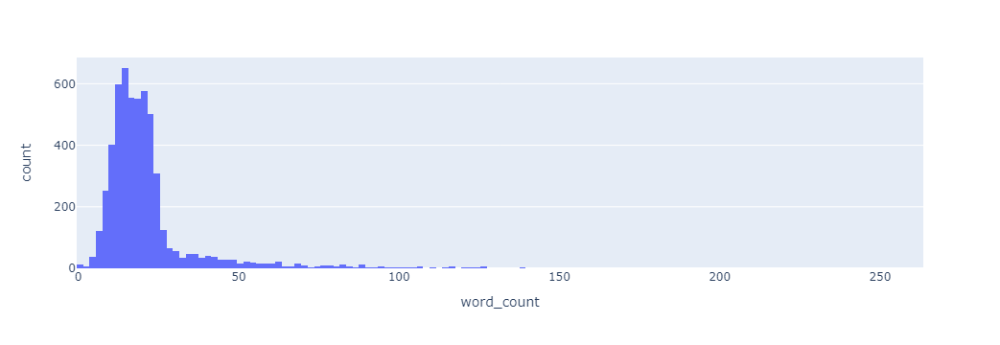

In [135]:
fig = px.histogram(df, x="word_count")
fig.show()

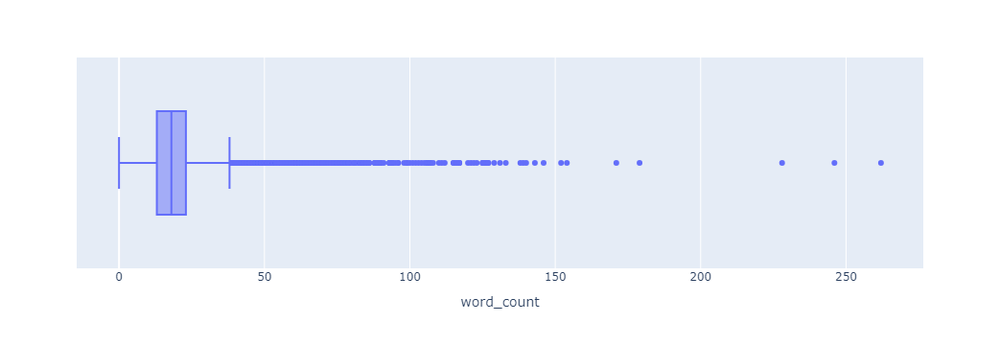

In [136]:
fig = px.box(df, x="word_count")
fig.show()

In [137]:
q1=df['word_count'].quantile(.25)
q3=df['word_count'].quantile(.75)

iqr = q3-q1

lower_whisker = q1-(1.5*iqr)
upper_whisker = q3+(1.5*iqr)

outliers = processed_df[processed_df['word_count']>upper_whisker]

In [138]:
outliers.head()

,imdb_id,rating_count,best_rating,worst_rating,rating,genre,keywords,actors,director,summary,title,year,preprocessed_tokens,clean_text,word_count
345,tt8674464,409.0,10.0,1.0,4.4,Action,[''],"['Robert Bronzi', 'Kenny Hendrix', 'Chris Hahn']",['Gary Jones'],"After the death of his brother, Mick travels t...",346. Escape from Death Block 13,2021,"['death', 'brother', 'mick', 'travel', 'americ...",death brother mick travel america seek justice...,39
348,tt11944928,6467.0,10.0,1.0,4.9,Crime,"['brother brother relationship', 'written by d...","['Neal McDonough', 'Dash Melrose', 'Michael Cu...",['Derek Presley'],A dangerous hitman (Neal McDonough) is tasked ...,349. Red Stone,2021,"['dangerous', 'hitman', 'neal', 'mcdonough', '...",dangerous hitman neal mcdonough tasked hunting...,40
356,tt14061478,154.0,10.0,1.0,8.2,Musical,[''],"['Casey Elliott', 'Katherine Thomas', 'Tyler H...",['Rob Gardner'],Embrace the hope of Easter and experience the ...,357. Lamb of God: The Concert Film,2021,"['embrace', 'hope', 'easter', 'experience', 'p...",embrace hope easter experience power last week...,56
406,tt13863968,1513.0,10.0,1.0,8.0,Documentary,"['trauma', 'pain', 'psychology', 'therapy', 'e...","['Russell Brand', 'James Doty', 'Tim Ferriss']","['Maurizio Benazzo', 'Zaya Benazzo']",1 in 5 Americans are diagnosed with mental ill...,407. The Wisdom of Trauma,2021,"['1', '5', 'american', 'diagnosed', 'mental', ...",1 5 american diagnosed mental illness every ye...,52
419,tt9038678,1071.0,10.0,1.0,5.6,Action,"['neo western', 'novel']","['Tom Skerritt', 'Mira Sorvino', 'Annie Gonzal...",['S.J. Chiro'],Based on the best-selling novel by David Guter...,420. East of the Mountains,2021,"['based', 'bestselling', 'novel', 'david', 'gr...",based bestselling novel david grierson retired...,39


#### Not removing outliers since they are just extreme values and would be essential for training

#### Now lets find most common words in top 3 genre by count

In [139]:
top_genre_list = processed_df.groupby('genre').size().sort_values(ascending=False).reset_index(name='count')[:3]['genre'].to_list()
top_genre_list

['Documentary', 'Drama', 'Comedy']

In [140]:
def print_wc_and_bargraph(df, genre):
    all_tokens = [token for each_tokens in genre_df['preprocessed_tokens'] for token in ast.literal_eval(each_tokens)]

    word_counter = Counter(all_tokens)
    top_50 = word_counter.most_common(100)
    top_10 = word_counter.most_common(10)
    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(top_50))
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {genre}')
    plt.show()
    print()
    
    words, counts = zip(*top_10)
    plt.figure(figsize=(10, 5))
    plt.bar(words, counts)
    plt.xlabel('Words')
    plt.ylabel('Counts')
    plt.title(f'Word Counts for {genre}')
    plt.xticks(rotation=45)
    plt.show()
    print()

Word Cloud of Top 50 words and Bar graph of Top 10 words for genre Documentary


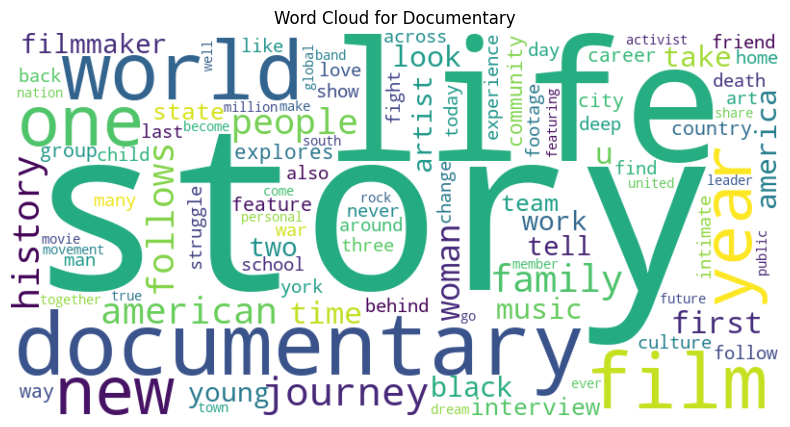

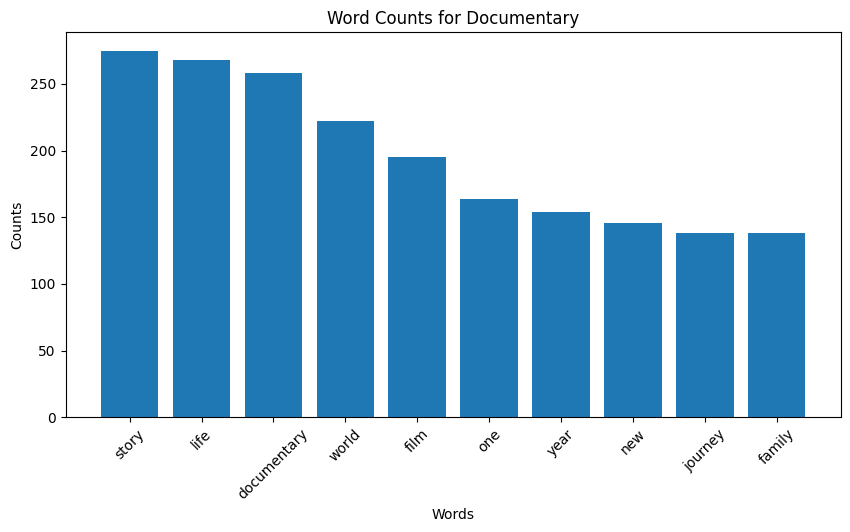


Word Cloud of Top 50 words and Bar graph of Top 10 words for genre Drama


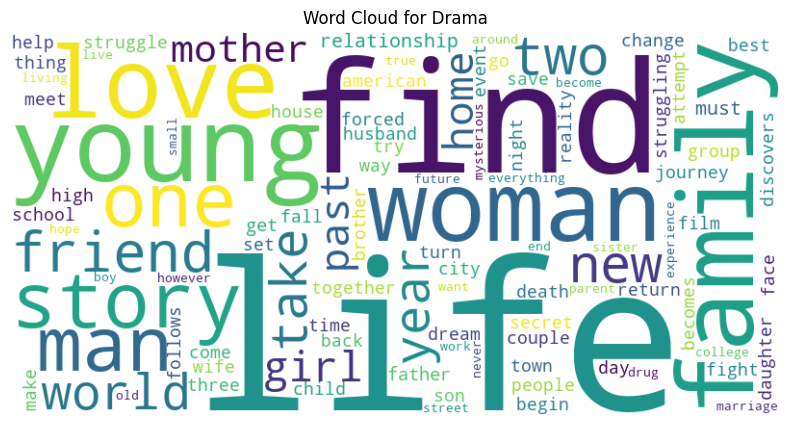

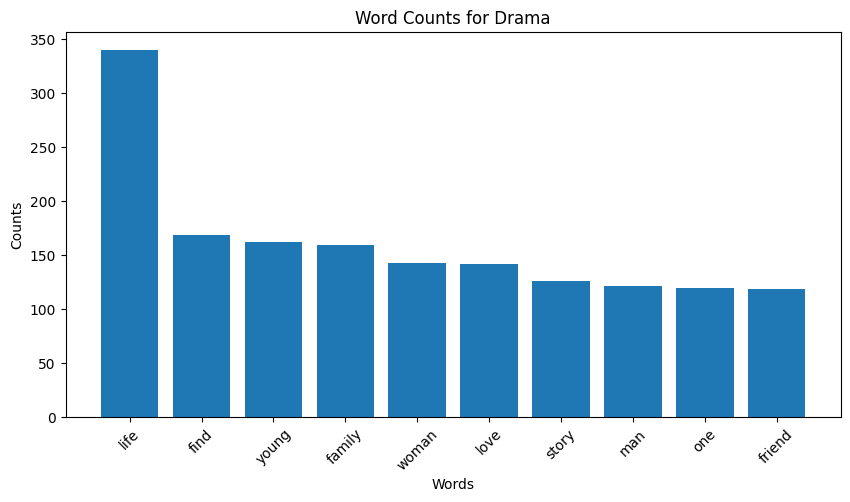


Word Cloud of Top 50 words and Bar graph of Top 10 words for genre Comedy


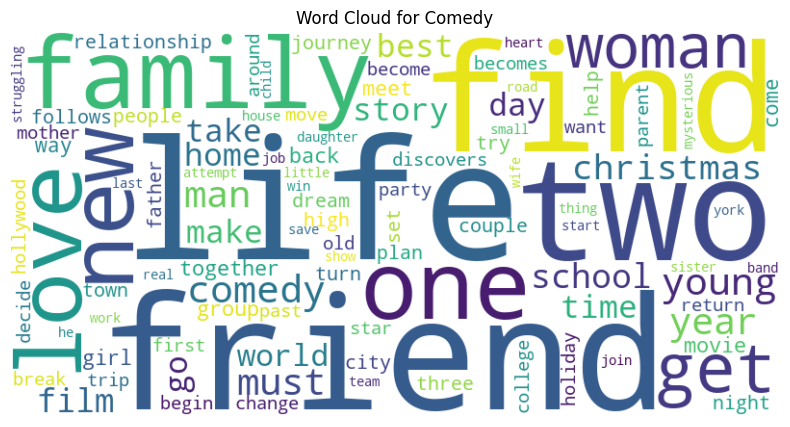

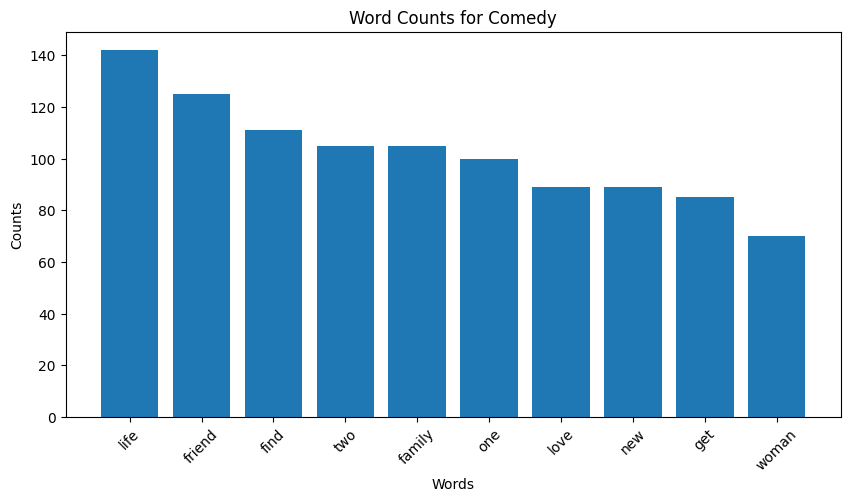

In [141]:
for each in top_genre_list:
    print(f"Word Cloud of Top 50 words and Bar graph of Top 10 words for genre {each}")
    genre_df = processed_df[processed_df['genre'] == each]
    print_wc_and_bargraph(genre_df, each)



#### Preparing for model building

In [142]:
processed_df.head()

,imdb_id,rating_count,best_rating,worst_rating,rating,genre,keywords,actors,director,summary,title,year,preprocessed_tokens,clean_text,word_count
0,tt1160419,841928.0,10.0,1.0,8.0,Action,"['mother son relationship', 'mind control', 'e...","['Timothée Chalamet', 'Rebecca Ferguson', 'Zen...",['Denis Villeneuve'],A noble family becomes embroiled in a war for ...,1. Dune: Part One,2021,"['noble', 'family', 'becomes', 'embroiled', 'w...",noble family becomes embroiled war control gal...,15
1,tt4513678,216621.0,10.0,1.0,7.0,Adventure,"['ghost', 'ghostbuster', 'ghostbusters', 'sing...","['Carrie Coon', 'Paul Rudd', 'Finn Wolfhard']",['Jason Reitman'],When a single mom and her two kids arrive in a...,2. Ghostbusters: Afterlife,2021,"['single', 'mom', 'two', 'kid', 'arrive', 'sma...",single mom two kid arrive small town begin dis...,17
2,tt5034838,239498.0,10.0,1.0,6.3,Action,"['monster versus monster', 'kaiju', 'godzilla ...","['Alexander Skarsgård', 'Millie Bobby Brown', ...",['Adam Wingard'],The epic next chapter in the cinematic Monster...,3. Godzilla vs. Kong,2021,"['epic', 'next', 'chapter', 'cinematic', 'mons...",epic next chapter cinematic monsterverse pit t...,20
3,tt11235772,31826.0,10.0,1.0,6.1,Drama,"['female voyeur', 'couple having sex while wat...","['Sydney Sweeney', 'Justice Smith', 'Ben Hardy']",['Michael Mohan'],Pippa and Thomas move into their dream apartme...,4. The Voyeurs,2021,"['pipe', 'thomas', 'move', 'dream', 'apartment...",pipe thomas move dream apartment notice window...,17
4,tt10872600,875483.0,10.0,1.0,8.2,Action,"['spider man character', 'superhero', 'marvel ...","['Tom Holland', 'Zendaya', 'Benedict Cumberbat...",['Jon Watts'],"With Spider-Man's identity now revealed, Peter...",5. Spider-Man: No Way Home,2021,"['spidermans', 'identity', 'revealed', 'peter'...",spidermans identity revealed peter asks doctor...,22


In [143]:
main_df = processed_df[['imdb_id', 'title', 'genre', 'clean_text']]

In [144]:
main_df.shape

(5380, 4)

In [145]:
main_df.head()

,imdb_id,title,genre,clean_text
0,tt1160419,1. Dune: Part One,Action,noble family becomes embroiled war control gal...
1,tt4513678,2. Ghostbusters: Afterlife,Adventure,single mom two kid arrive small town begin dis...
2,tt5034838,3. Godzilla vs. Kong,Action,epic next chapter cinematic monsterverse pit t...
3,tt11235772,4. The Voyeurs,Drama,pipe thomas move dream apartment notice window...
4,tt10872600,5. Spider-Man: No Way Home,Action,spidermans identity revealed peter asks doctor...


## Model Building

In [146]:
model_scores = {}

#### KMeans and Word2Vec

In [147]:
sentences = [text.split() for text in main_df['clean_text']]
word2vec_model = Word2Vec(sentences, vector_size=100, window=5, min_count=1, sg=1)

In [148]:
def document_vector(doc):
    word_vectors = [word2vec_model.wv[word] for word in doc if word in word2vec_model.wv]
    return np.mean(word_vectors, axis=0)

In [149]:
document_vectors = [document_vector(doc) for doc in sentences]

In [150]:
wcss = []
for k in range(2, 22):
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(document_vectors)
    wcss.append(kmeans.inertia_)

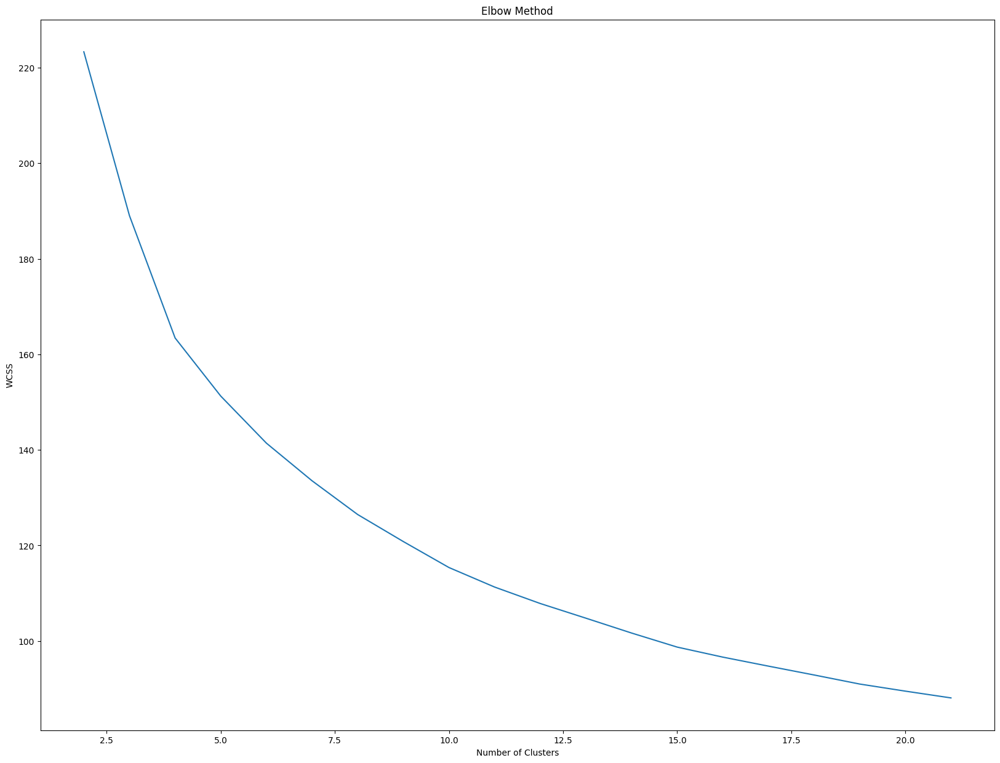

In [151]:
plt.plot(range(2, 22), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS') 
plt.show()

#### Taking optimal value for K as 20 since the model seems to be converging there

In [152]:
optimal_k = 20

In [153]:
kmeans = KMeans(n_clusters=20, init='k-means++', max_iter=300, n_init=10, random_state=0)
kmeans_clusters = kmeans.fit_predict(document_vectors)

In [154]:
silhouette_avg = silhouette_score(document_vectors, kmeans_clusters)
print(f"For n_clusters = {optimal_k}, The average silhouette_score is: {round(silhouette_avg, 2)}")

For n_clusters = 20, The average silhouette_score is: 0.12999999523162842


In [155]:
# Appending silhouette_score to model scores list
model_scores['KMeans'] = round(silhouette_avg, 2)

#### The Silhouette score is not very impressive for KMeans

In [156]:
centroids = kmeans.cluster_centers_

top_words_per_cluster = []
for centroid in centroids:
    similarities = word2vec_model.wv.cosine_similarities(centroid, word2vec_model.wv.vectors)
    top_word_indices = similarities.argsort()[-50:][::-1]
    top_words = [word2vec_model.wv.index_to_key[idx] for idx in top_word_indices]
    top_words_per_cluster.append(top_words)

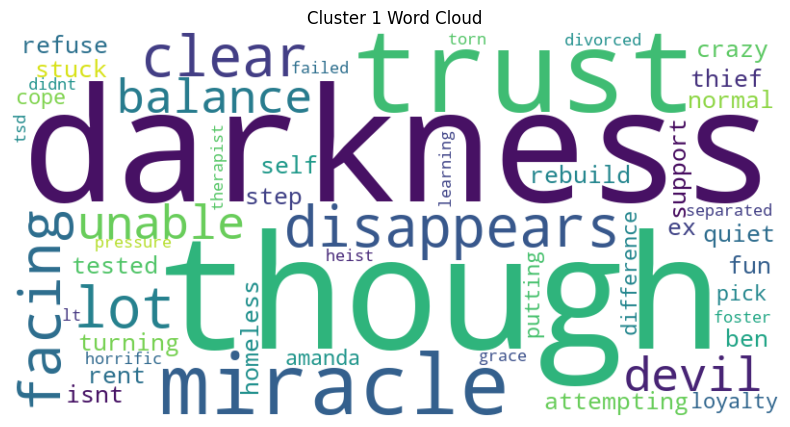

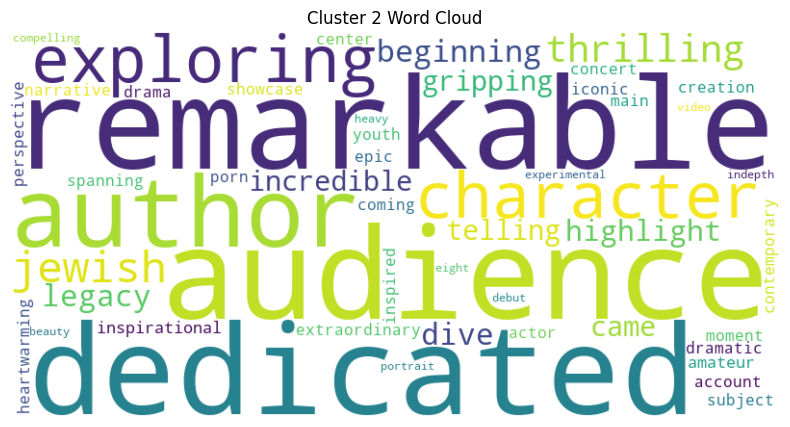

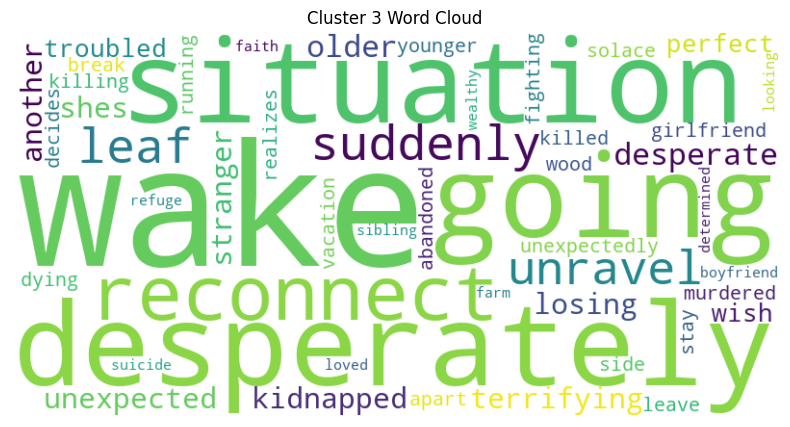

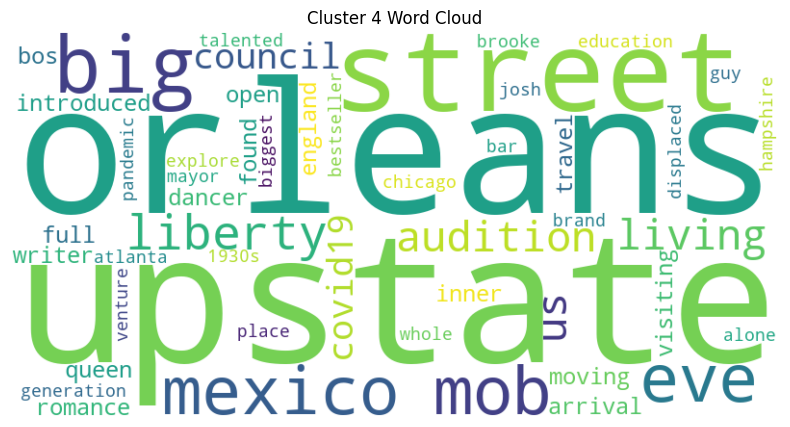

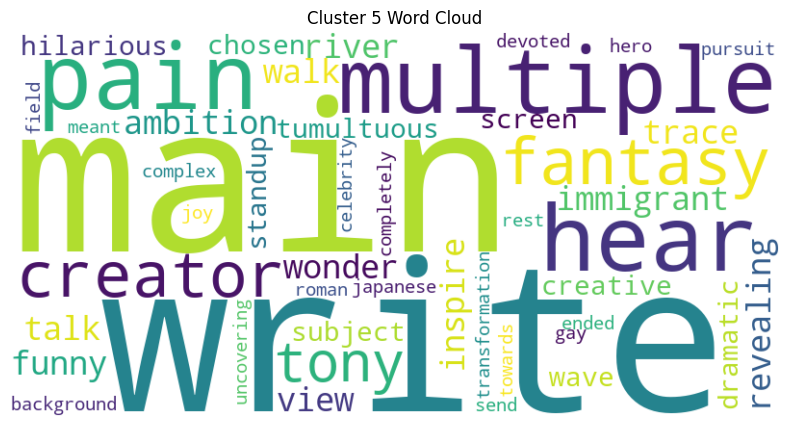

...

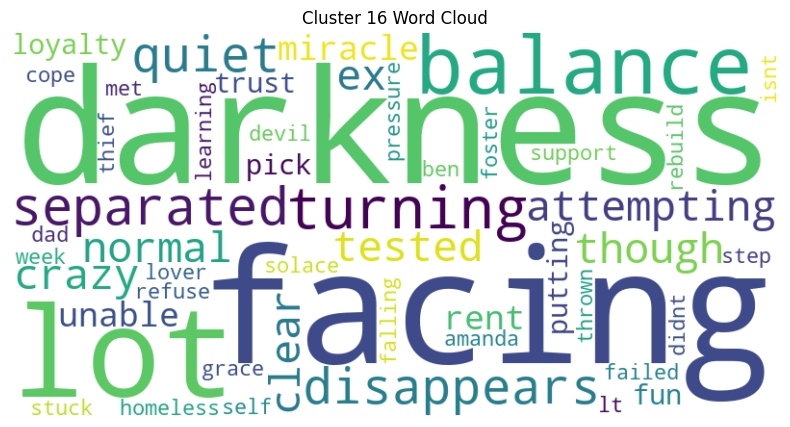

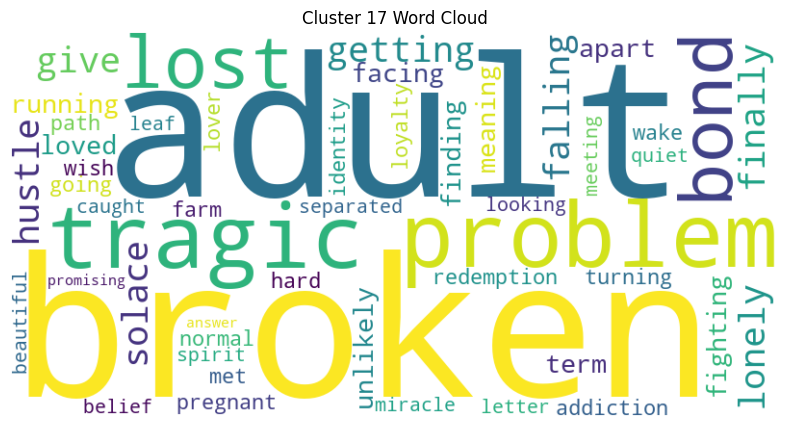

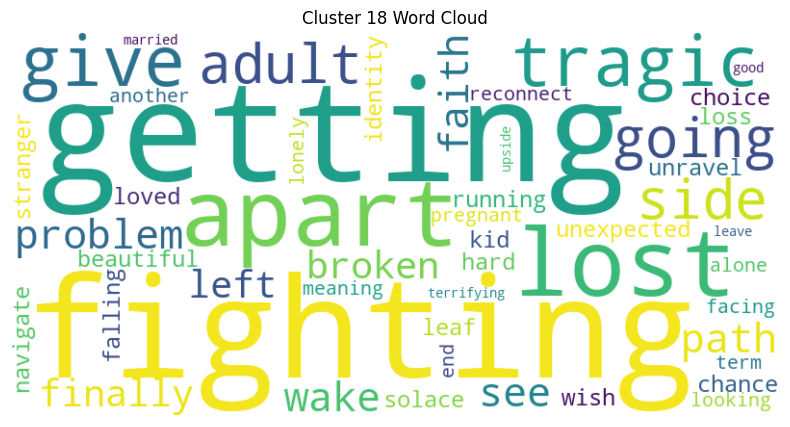

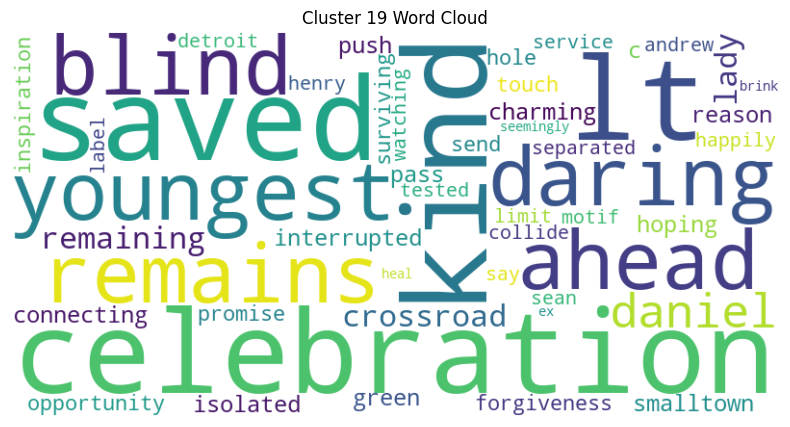

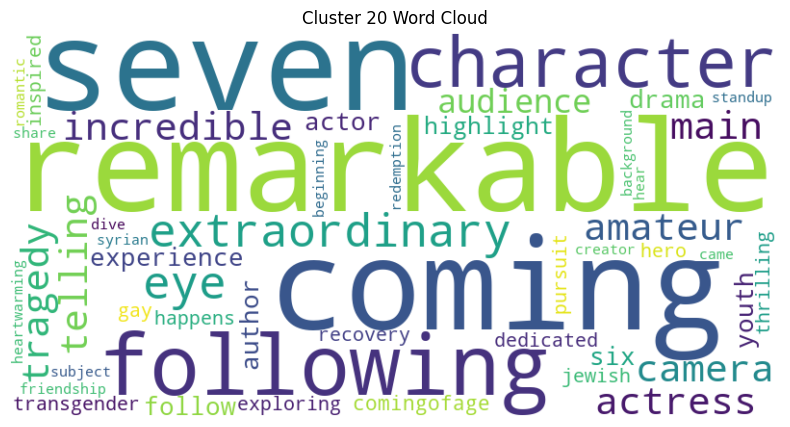

In [157]:
for i, top_words in enumerate(top_words_per_cluster):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(top_words))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Cluster {i+1} Word Cloud')
    plt.axis('off')
    plt.show()

## Hierarchical Clustering & Word2Vec

#### Trying Hierarchical Clustering since KMeans Silhouette score was not that great

In [158]:
optimal_k = 16

agg_clustering = AgglomerativeClustering(n_clusters=16, affinity='cosine', linkage='average')
agg_clusters = agg_clustering.fit_predict(document_vectors)

C:\Users\msani\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead



In [159]:
h_cluster = main_df.copy()
h_cluster['cluster'] = agg_clusters

In [160]:
silhouette_avg = silhouette_score(document_vectors, agg_clusters)
print(f"For n_clusters = {optimal_k}, The average silhouette_score is: {round(silhouette_avg, 2)}")

For n_clusters = 16, The average silhouette_score is: 0.10999999940395355


In [161]:
# Appending silhouette_score to model scores list
model_scores['Hierarchical'] = round(silhouette_avg, 2)

#### The Silhouette score for Hierarchical clustering is same as KMeans which is again not very good

In [162]:
top_words_per_cluster = []
for cluster in range(agg_clusters.max() + 1):
    cluster_docs = h_cluster[h_cluster['cluster'] == cluster]['clean_text']
    cluster_text = ' '.join(cluster_docs)
    word_freq = {}
    for word in cluster_text.split():
        word_freq[word] = word_freq.get(word, 0) + 1
        
    top_words = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)[:100] 
    top_words_per_cluster.append(top_words)

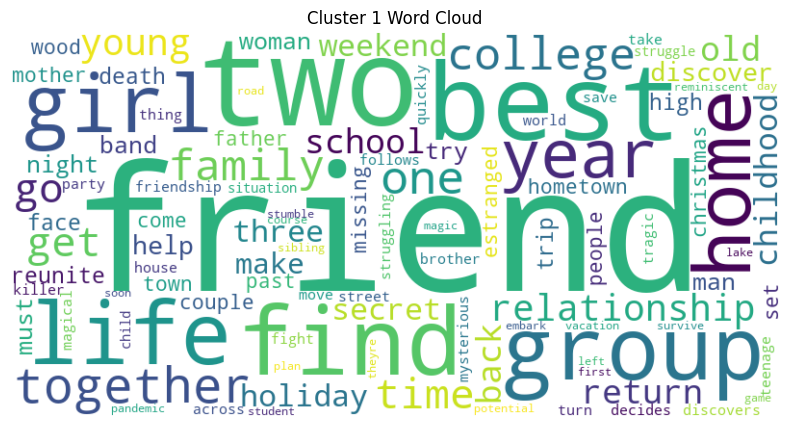

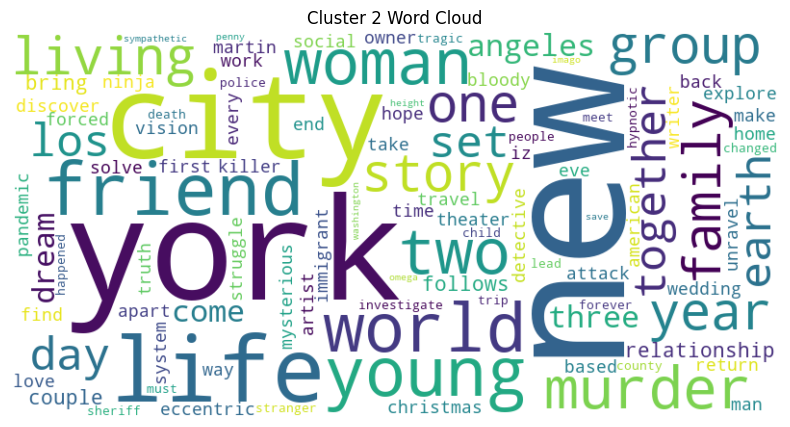

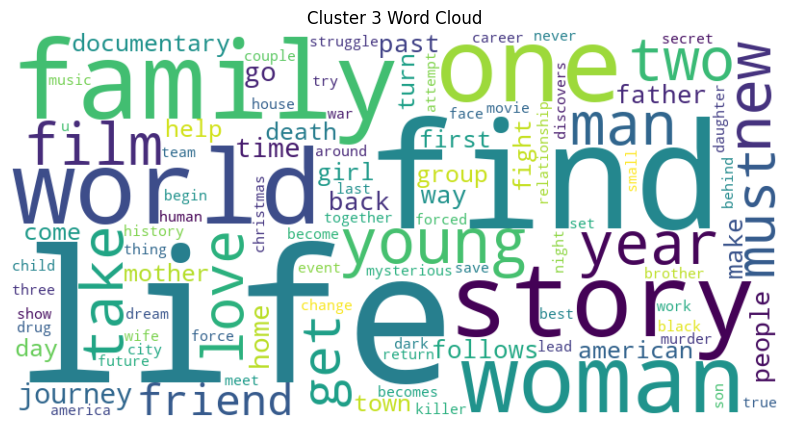

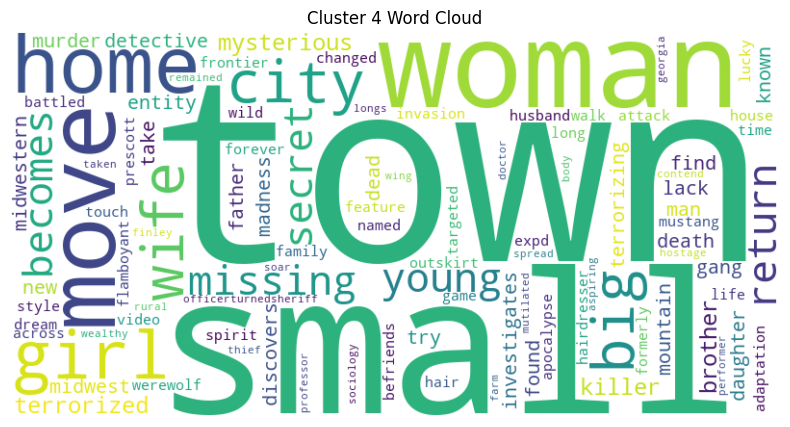

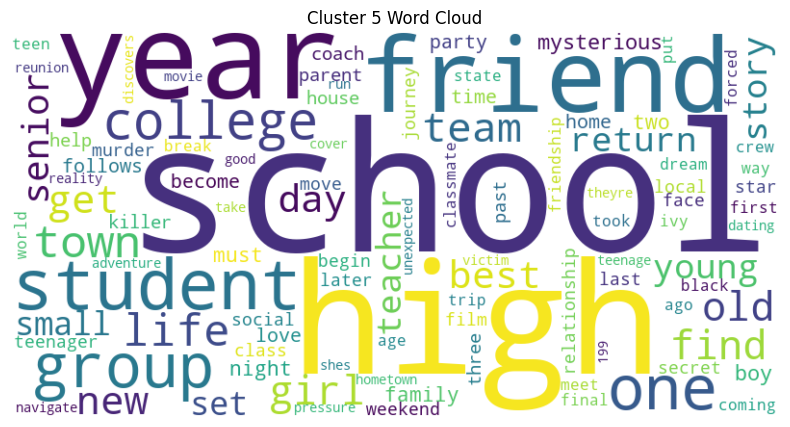

...

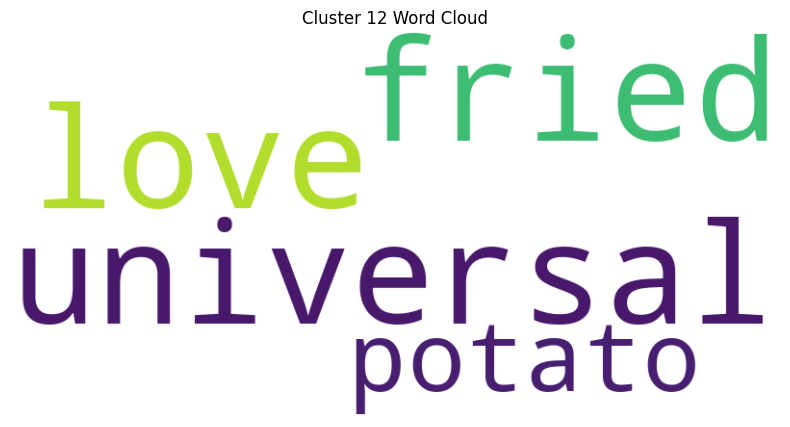

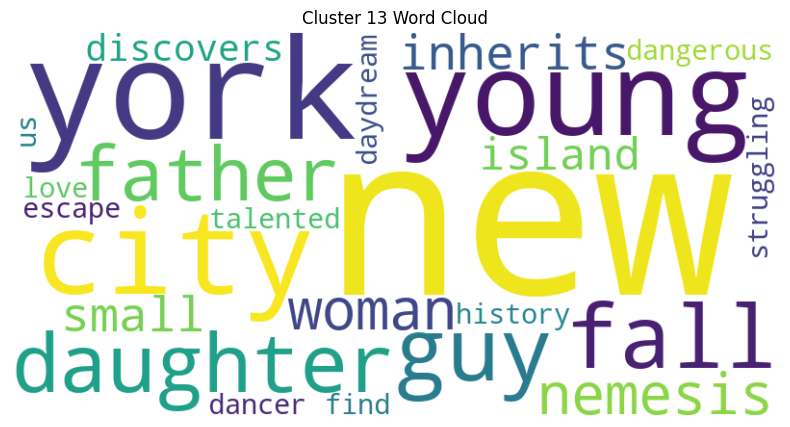

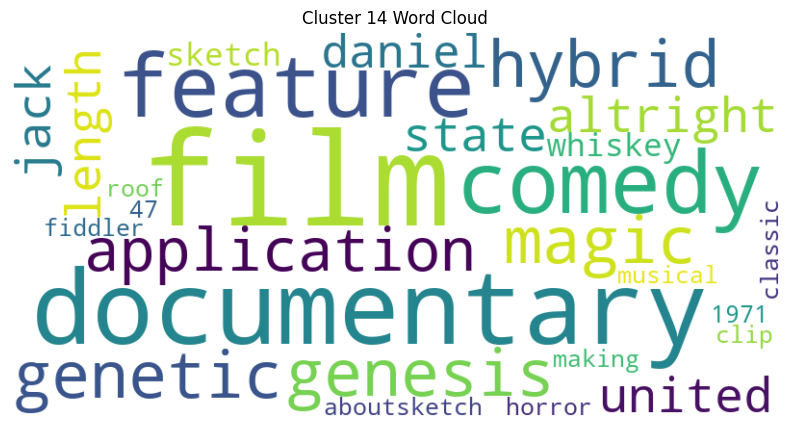

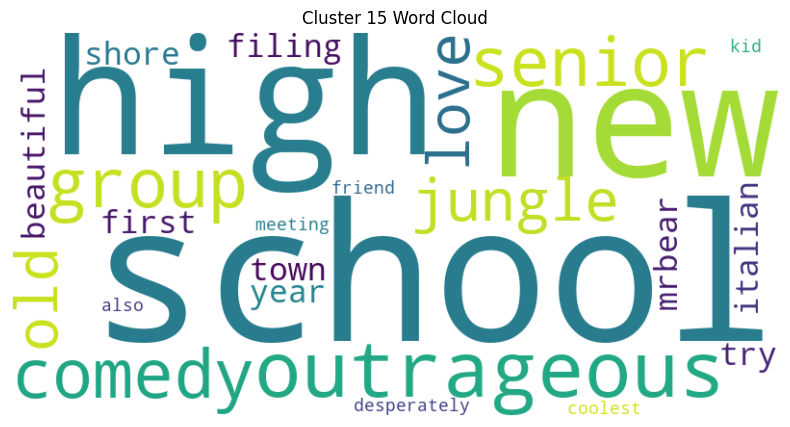

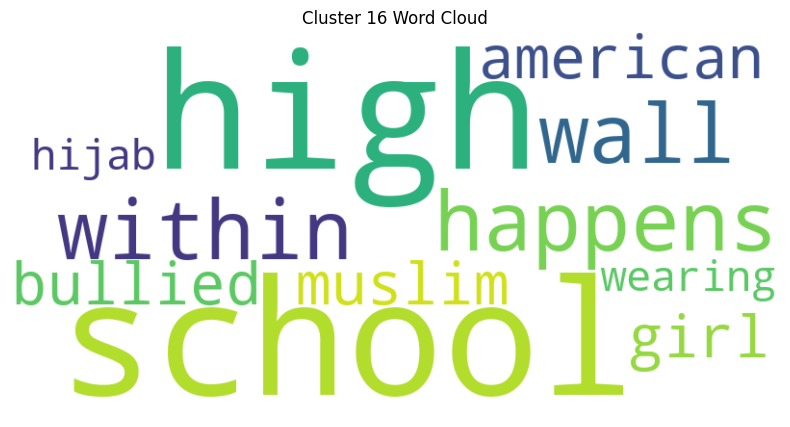

In [163]:
for i, top_words in enumerate(top_words_per_cluster):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(top_words))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Cluster {i+1} Word Cloud')
    plt.axis('off')
    plt.show()

## LDA

In [164]:
def prep_data(data):
    tokenized_summaries = [summary.lower().split() for summary in data]
    dictionary = Dictionary(tokenized_summaries)
    corpus = [dictionary.doc2bow(summary) for summary in tokenized_summaries]
    return corpus, dictionary

In [165]:
corpus, dictionary = prep_data(main_df['clean_text'])

In [173]:
def get_optimal_k(corpus, id2word, k, c=500):
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=k, 
                                           random_state=100,
                                           chunksize=c,
                                           passes=10)
    coherence_model_lda = CoherenceModel(model=lda_model, texts=[each.split() for each in main_df['clean_text'].tolist()], dictionary=dictionary, coherence='c_v')
    coherence_score = coherence_model_lda.get_coherence()
    return coherence_score

In [174]:
min_k = 2
max_k = 22
step = 3
topic_range = range(min_k, max_k, step)
coherence = []

for i in tqdm.tqdm(topic_range):
    score = get_optimal_k(corpus, dictionary, i)
    coherence.append(round(score, 2))

100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [11:15<00:00, 96.46s/it]


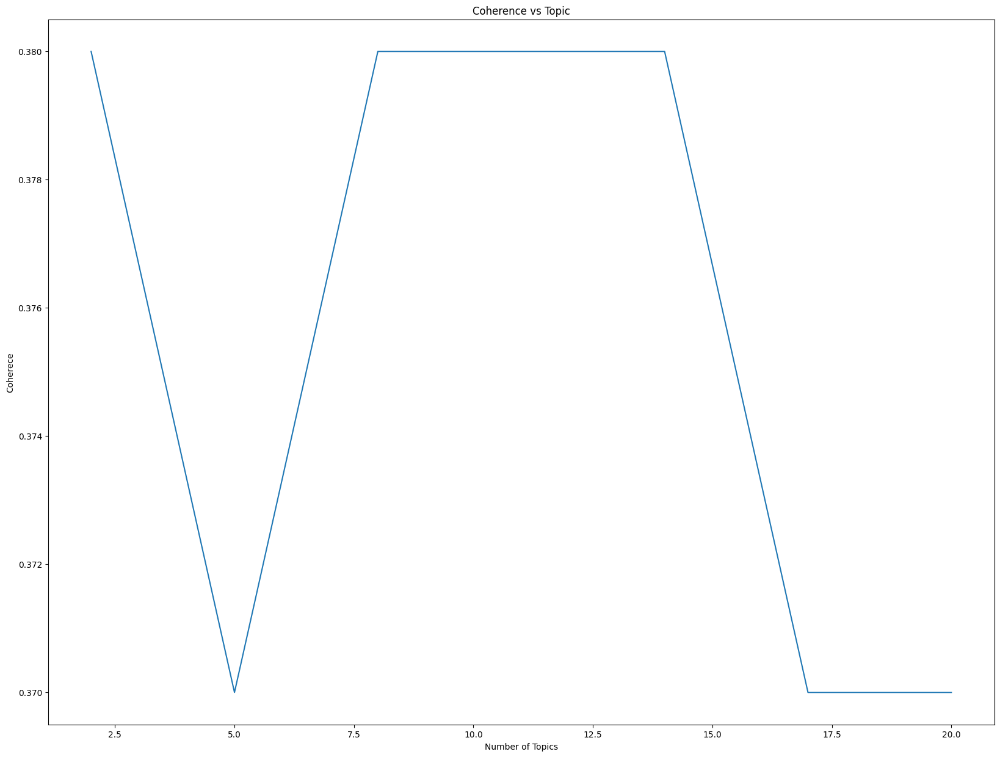

In [175]:
plt.plot(topic_range, coherence)
plt.title('Coherence vs Topic')
plt.xlabel('Number of Topics')
plt.ylabel('Coherece')
plt.show()

### So the number of topics around which coherence stabalizes is around 13, so we will consider the number of topics as 13

## While the coherence is still stable and okay, we will try to tune the hyperparameter and see if that improves the coherence overall over the same range of topics

In [176]:
chunk_size = [100, 500, 1000, 1500]

min_k = 2
max_k = 22
step = 5
topic_range = range(min_k, max_k, step)

model_results = {
                 'Topics': [],
                 'Chunk': [],
                 'Coherence': []
                }

pbar = tqdm.tqdm(total=(len(topic_range)*len(chunk_size)))

for k in topic_range:
    for c in chunk_size:
            score = get_optimal_k(corpus, dictionary, k, c)
            model_results['Topics'].append(k)
            model_results['Chunk'].append(c)
            model_results['Coherence'].append(round(score, 2))

            pbar.update(1)


results = pd.DataFrame(model_results)

100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [12:32<00:00, 46.80s/it]

In [177]:
results

,Topics,Chunk,Coherence
0,2,100,0.39
1,2,500,0.38
2,2,1000,0.38
3,2,1500,0.38
4,7,100,0.39
5,7,500,0.38
6,7,1000,0.38
7,7,1500,0.39
8,12,100,0.38
9,12,500,0.37


<Axes: xlabel='Topics', ylabel='Coherence'>

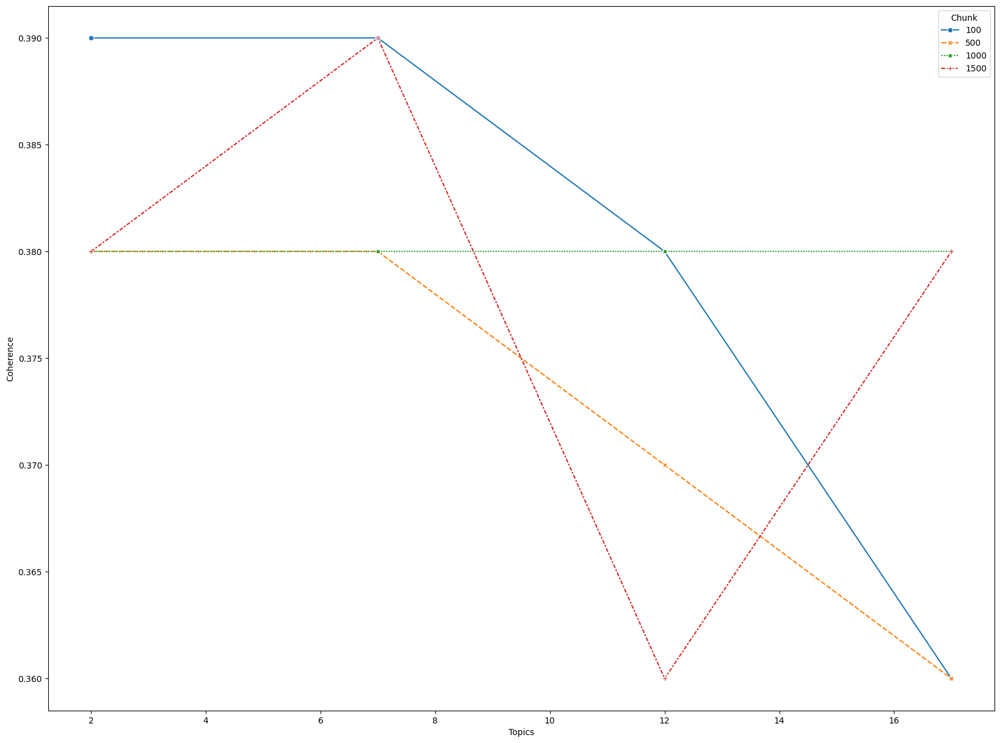

In [179]:
sns.lineplot(data=results, x="Topics", y="Coherence", hue='Chunk', palette=sns.color_palette(n_colors=4), markers=True, style='Chunk')

## Stable coherence seems to be around 0.37 and hence we will choose hyperparameters K=10 and Chunk=500 for our final model

In [180]:
optimal_k = 10

best_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=optimal_k, 
                                           random_state=100,
                                           chunksize=500,
                                           passes=10)

coherence_model_lda = CoherenceModel(model=best_model, texts=[each.split() for each in main_df['clean_text'].tolist()], dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model_lda.get_coherence()

print(f"Coherence of our best model is: {coherence_score}")

Coherence of our best model is: 0.3717016293214065


In [181]:
# Appending Coherence to model scores list
model_scores['LDA'] = round(coherence_score, 2)

In [182]:
def build_word_clouds_lda(model, corpus):
    tm_results = model[corpus]
    corpus_topics = [sorted(topics, key=lambda record: -record[1])[0] for topics in tm_results]
    topics = [[(term, round(wt, 3)) for term, wt in model.show_topic(n, topn=50)] for n in range(0, model.num_topics)]

    topics_df = pd.DataFrame([', '.join([term for term, wt in topic]) for topic in topics], columns = ['Terms per Topic'], index=['Topic'+str(t) for t in range(1, model.num_topics+1)] )

    wc = WordCloud(background_color="white", width=800, height=400)
    plt.rcParams['figure.figsize'] = [20, 15]
    for i in range(10):
        wc.generate(text=topics_df["Terms per Topic"][i])
        plt.figure(figsize=(10, 5))
        plt.imshow(wc, interpolation="bilinear")
        plt.axis("off")
        plt.title(topics_df.index[i])
    
    # plt.show()
    return corpus_topics, topics_df


C:\Users\msani\AppData\Local\Temp\ipykernel_23520\131279149.py:11: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



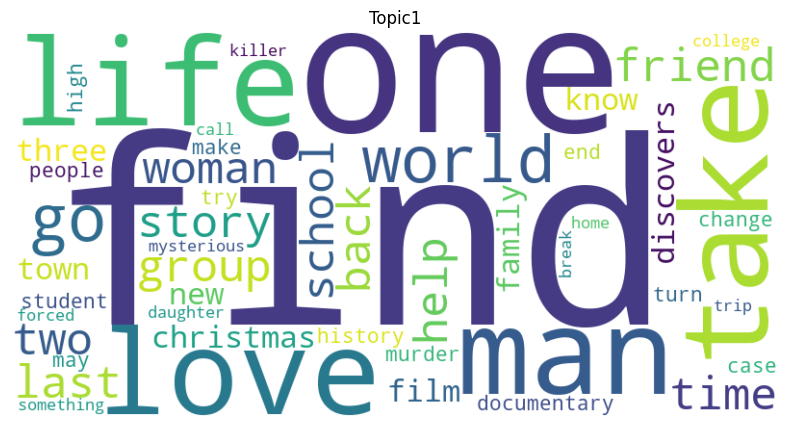

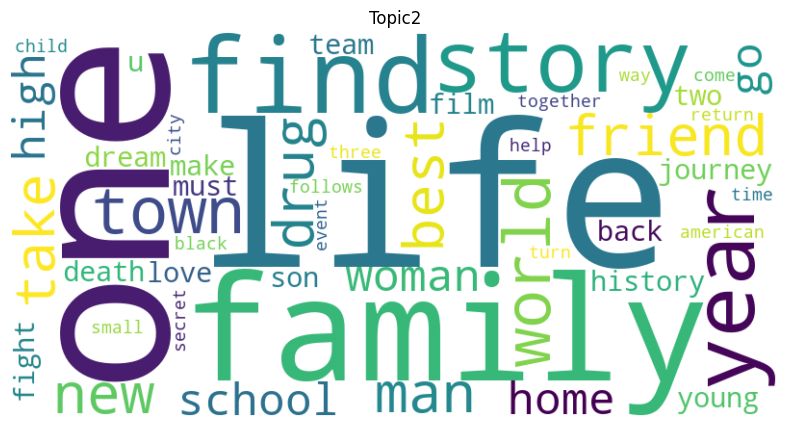

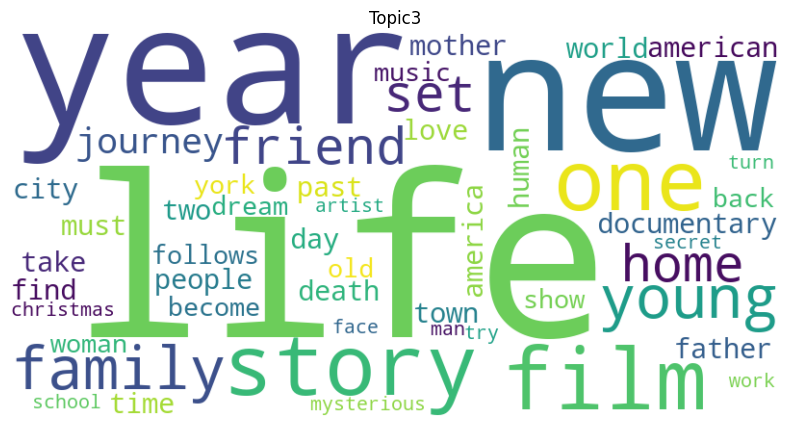

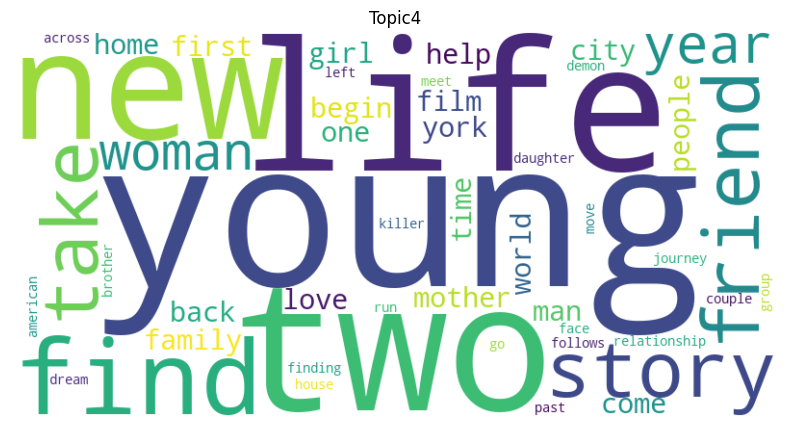

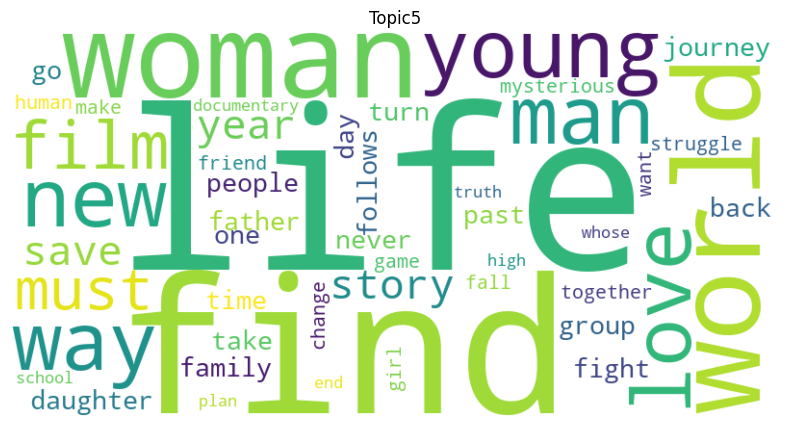

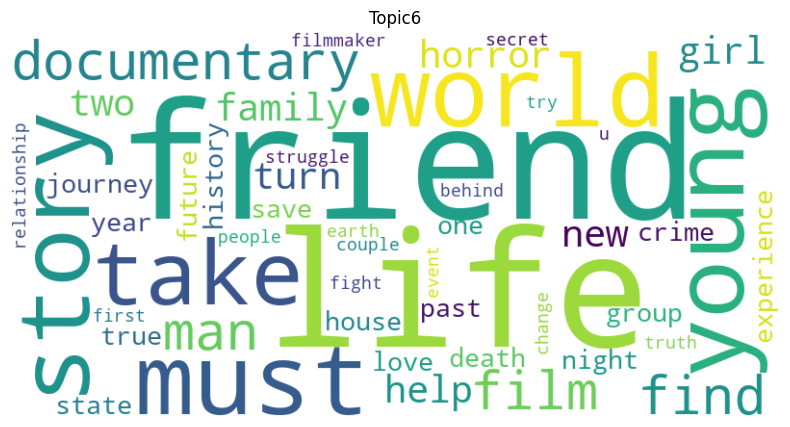

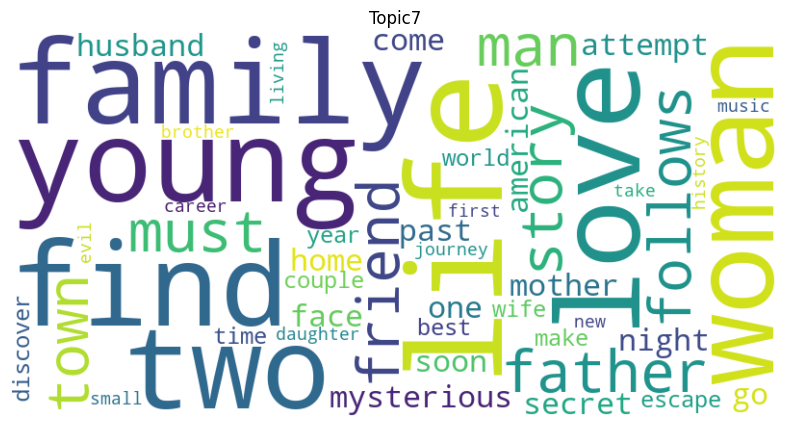

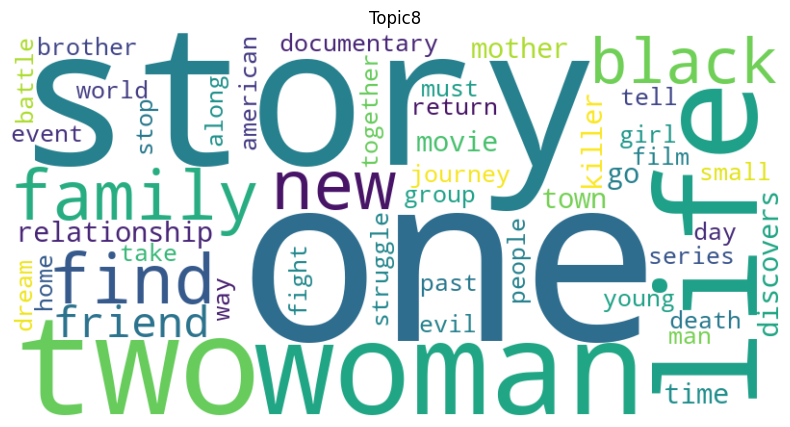

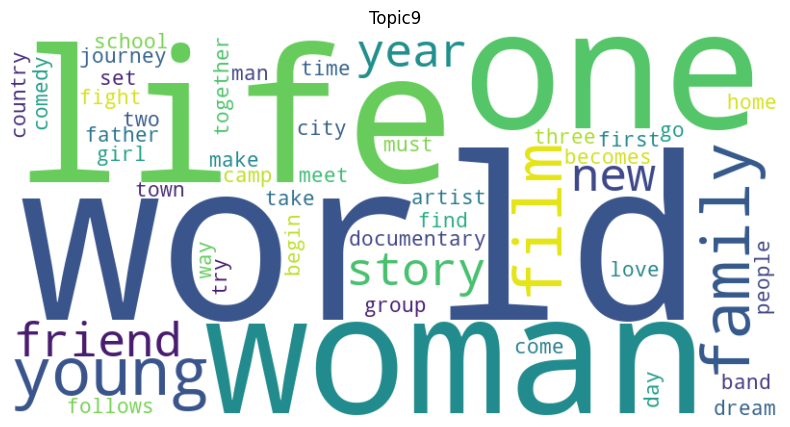

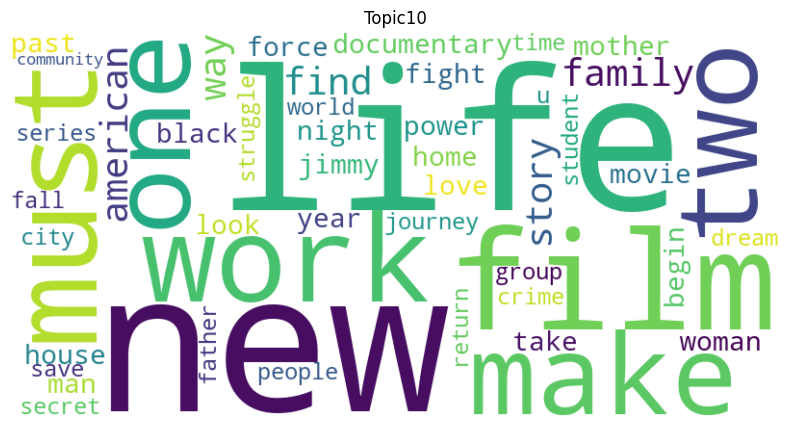

In [183]:
corpus_topics, topics_df = build_word_clouds_lda(best_model, corpus)

## Model Comparison

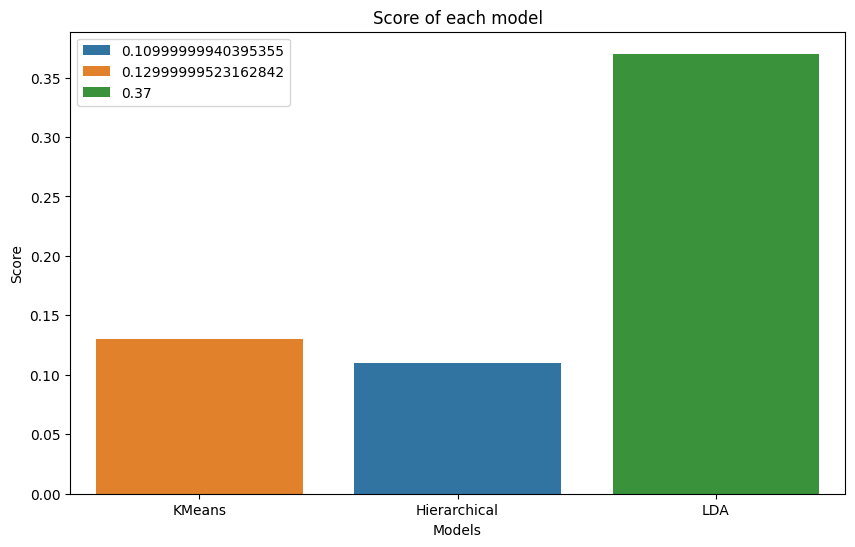

In [184]:
plt.figure(figsize=(10, 6))
sns.barplot(x=list(model_scores.keys()), y=list(model_scores.values()), hue=list(model_scores.values()), palette=sns.color_palette(n_colors=3))
plt.xlabel('Models')
plt.ylabel('Score')
plt.title('Score of each model')
plt.show()

## Model Testing

In [191]:
def add_topics_to_docs(orig_df):
    corpus_topic_df = pd.DataFrame()
    corpus_topic_df['title'] = orig_df['title']
    corpus_topic_df['genre'] = orig_df['genre']
    corpus_topic_df['summary'] = orig_df['clean_text']
    corpus_topic_df['Dominant Topic'] = [item[0]+1 for item in corpus_topics]
    corpus_topic_df['Contribution %'] = [round(item[1]*100, 2) for item in corpus_topics]
    corpus_topic_df['Topic Terms'] = [topics_df.iloc[t[0]]['Terms per Topic'] for t in corpus_topics]
    return corpus_topic_df
    

In [192]:
corpus_topic_df = add_topics_to_docs(main_df)

In [193]:
corpus_topic_df.groupby(['genre', 'Dominant Topic']).size().reset_index(name='count').groupby('genre').apply(lambda x: x.loc[x['count'].idxmax()])

C:\Users\msani\AppData\Local\Temp\ipykernel_23520\427659615.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,genre,Dominant Topic,count
genre,,,
Action,Action,1,67
Adventure,Adventure,2,14
Animation,Animation,5,18
Biography,Biography,3,13
Comedy,Comedy,9,106
Crime,Crime,1,37
Documentary,Documentary,3,204
Drama,Drama,7,156
Family,Family,9,7


#### Saving best model and the final file with genres

In [202]:
import pickle

save_lda_model = open("lda_model.pkl", "wb")
pickle.dump(best_model, save_lda_model)
save_lda_model.close()

resultant_file = corpus_topic_df.to_csv("lda_result_file.cs")

AttributeError: 'DataFrame' object has no attribute 'to'

#### Testing the saved model, later below function would also serve front-end

In [197]:
lda_model_f = open("lda_model.pkl", "rb")
lda_model = pickle.load(lda_model_f)
lda_model_f.close()

def detect_genre_lda(test_summary):
    test_summary_bow = dictionary.doc2bow([each for each in test_summary.split()])
    test_topics = lda_model.get_document_topics(test_summary_bow)
    max_topic = max(test_topics, key=lambda item: item[1])[0]

    test_df = corpus_topic_df[corpus_topic_df['Dominant Topic']==max_topic]

    print(f"Detected genre for the given keywords is: {test_df['genre'].unique()[0]}")
    movies = test_df.iloc[0:5]['title'].to_list()
    print(f"Movies you may like based on your preference: {movies}")
    

In [201]:
detect_genre_lda("sarah teen girl looking forward 18th birthday move away controlling father could even blow candle imprisoned basement home")

Detected genre for the given keywords is: Adventure
Movies you may like based on your preference: ['2. Ghostbusters: Afterlife', '4. The Voyeurs', "10. Don't Look Up", '13. No Time to Die', "14. The King's Man"]
